# Pre Test set

In [27]:
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
from hyperspy.learn.rpca import rpca_godec, orpca
path = 'data/MOLLI_pre_dataset/test/9353628_20140129_MOLLI_1.npy'
vols = np.load(path).transpose(1, 2, 0)
x, y, z = vols.shape
print(f"x is {x} and y is {y} and z is {z}")
M = vols.reshape(x*y, z)
print(M.shape)
# low, sparse, U, S, V = rpca_godec(M, rank=7, lambda1=1)
# low_matrix = low.reshape((x, y, z))
# sparse_matrix = sparse.reshape((x, y, z))

# fig = plt.figure(figsize=(11, 3))
# title_font_size=8
# title_pad = 10
# for i in range(z):
#     ax1 = fig.add_subplot(3, 11, 1+i)
#     plt.imshow(vols[..., i], cmap='gray')
#     plt.axis('off')
#     ax1.set_title(f"Timestep{i+1}", fontsize=title_font_size, pad=title_pad)

#     ax2 = fig.add_subplot(3, 11, 12+i)
#     plt.imshow(low_matrix[..., i], cmap='gray')
#     plt.axis('off')

#     ax3 = fig.add_subplot(3, 11, 23+i)
#     plt.imshow(sparse_matrix[..., i], cmap='gray')
#     plt.axis('off')

x is 224 and y is 224 and z is 11
(50176, 11)


In [28]:
import pandas as pd
df = pd.DataFrame()
df_2 = pd.DataFrame()

## Test Metrics

### Original volume

#### First Eigen Component percentage

In [29]:
from scripts.utils import *
orig_path = 'data/MOLLI_pre_dataset/test'
orig_pca_changes = []
for file in sorted(glob.glob(os.path.join(orig_path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    orig_pca_changes.append(org_dis)
print(f"Mean of original PCA is {np.mean(np.array(orig_pca_changes))}")

Mean of original PCA is 0.7867720274668718


#### T1 fitting

In [30]:
import scipy.io
from pathlib import Path
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy import ndimage

title_font_size=8
title_pad = 10
def plot_t1_changes(path, size=(20, 36)):
    fig = plt.figure(figsize=size)
    t1err_square_list = []
    t1err_heart_list = []
    t1err_myo_list = []
    subject_list = []
    
    neighbor = ndimage.generate_binary_structure(2, 2)
    for i, file in enumerate(sorted(glob.glob(os.path.join(path, '*.mat')))):
        subject = Path(file).stem
        subject_list.append(subject)
        fd = scipy.io.loadmat(file)
        SD_err = fd['S']
        areamask = fd['areamask']
        itemindex = np.where(areamask == 1)
        x1, x2 = itemindex[0][0], itemindex[0][-1]
        y1, y2 = itemindex[1][0], itemindex[1][-1]
        epi = fd['epi_BW']
        endo = fd['endo_BW']
        heartmask = ndimage.binary_dilation(epi, structure=neighbor, iterations=3).astype(epi.dtype)
        myomask = heartmask - endo
        
        errmap = SD_err * areamask
        square_SD_err = np.mean(errmap[areamask==1])
        t1err_square_list.append(square_SD_err)
        fig.add_subplot(10, 6, 1+i*6)
        ax = plt.gca()
        im = ax.imshow(errmap[x1:x2, y1:y2], cmap='jet', vmin=0, vmax=50)
        ax.axis('off')
        ax.set_title(f"Average SD error {(square_SD_err):.4f}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        t1_params_pre = fd['pmap_mse']
        a = t1_params_pre[:, :, 0]
        b = t1_params_pre[:, :, 1]
        c = t1_params_pre[:, :, 2]
        t1map = c * (b - 1)
        fig.add_subplot(10, 6, 2+i*6)
        ax = plt.gca()
        im = ax.imshow(t1map[x1:x2, y1:y2], cmap='jet', vmin=0, vmax=2500)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        hearterrmap = SD_err * heartmask
        heartt1map = t1map * heartmask
        heart_SD_err = np.mean(hearterrmap[heartmask==1])
        t1err_heart_list.append(heart_SD_err)

        fig.add_subplot(10, 6, 3+i*6)
        ax = plt.gca()
        im = ax.imshow(hearterrmap[x1:x2, y1:y2], cmap='jet', vmin=0, vmax=50)
        ax.axis('off')
        ax.set_title(f"Average SD error {(heart_SD_err):.4f} in ROI", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        fig.add_subplot(10, 6, 4+i*6)
        ax = plt.gca()
        im = ax.imshow(heartt1map[x1:x2, y1:y2], cmap='jet', vmin=0, vmax=2500)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        myoerrmap = SD_err * myomask
        myot1map = t1map * myomask
        myo_SD_err = np.mean(myoerrmap[myomask==1])
        t1err_myo_list.append(myo_SD_err)

        fig.add_subplot(10, 6, 5+i*6)
        ax = plt.gca()
        im = ax.imshow(myoerrmap[x1:x2, y1:y2], cmap='jet', vmin=0, vmax=50)
        ax.axis('off')
        ax.set_title(f"Average SD error {(myo_SD_err):.4f} in Myocardium", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        fig.add_subplot(10, 6, 6+i*6)
        ax = plt.gca()
        im = ax.imshow(myot1map[x1:x2, y1:y2], cmap='jet', vmin=0, vmax=2500)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)
    plt.subplots_adjust(left=0.0001,right=0.9, top=0.95, bottom=0.1,)
    return fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list

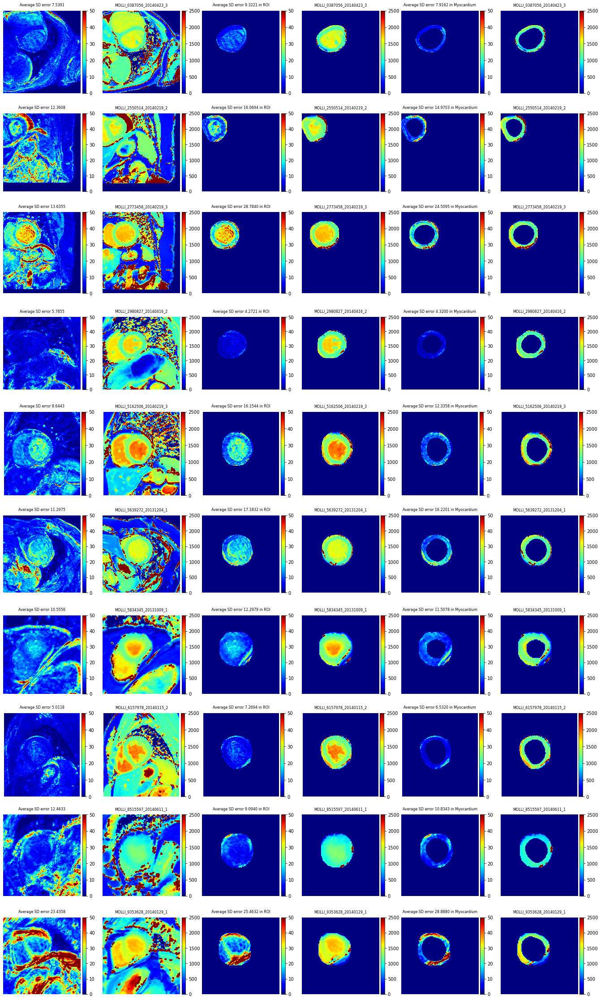

In [31]:
path = "data/MOLLI_pre_dataset/T1_SDerr"

fig, subject_list, orig_t1err_square_list, orig_t1err_heart_list, orig_t1err_myo_list = plot_t1_changes(path)
plt.savefig(f"data/MOLLI_pre_dataset/T1_SDerr/orig_t1err.png", dpi=300)

df['Cases'] = subject_list
df['Raw Square T1err'] = orig_t1err_square_list
df['Raw ROI T1err'] = orig_t1err_heart_list
df['Raw Myo T1err'] = orig_t1err_myo_list
df_2['Cases'] = subject_list
df_2['Raw PCA'] = orig_pca_changes

### Round 1

In [32]:
import voxelmorph_group as vxm  # nopep8
import numpy as np
import glob
import os
jacobian = vxm.losses.Jacobian().loss

In [33]:
r = 1
root = f"results/MOLLI_pre/Group/rank_11_5_5_5_5_5_5/nmi/smooth/image_loss_weight1/cycle_loss_weight0.01/weight0.001/bspline/cps4_svfsteps7_svfscale1/e80/test_MOLLI_pre"
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [34]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 1 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 1 PCA is 0.7942951914931508 and std is 0.0236053865194403


#### Jacobian Determination

In [35]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.002238247077912092


#### T1 fitting

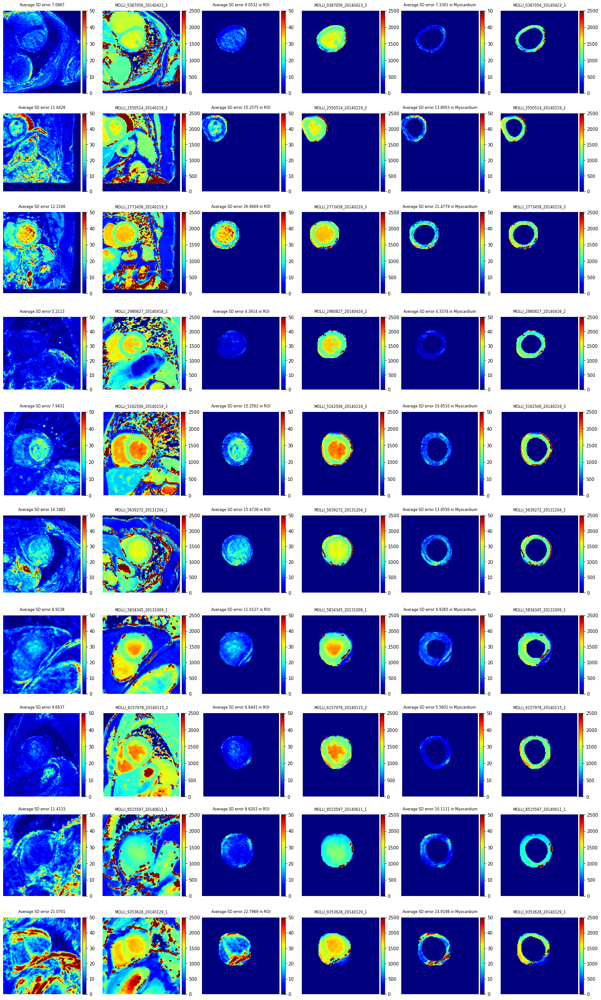

In [36]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R1 Square T1err'] = t1err_square_list
df['R1 ROI T1err'] = t1err_heart_list
df['R1 Myo T1err'] = t1err_myo_list
df_2['R1 PCA'] = pca_changes
df_2['R1 Det'] = mag_det_jac_det_list

### Round 2

In [37]:
r = 2
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [38]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.7983657065603247 and std is 0.022957341892718093


#### Jacobian Determination

In [39]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0028266713488847017


#### T1 fitting

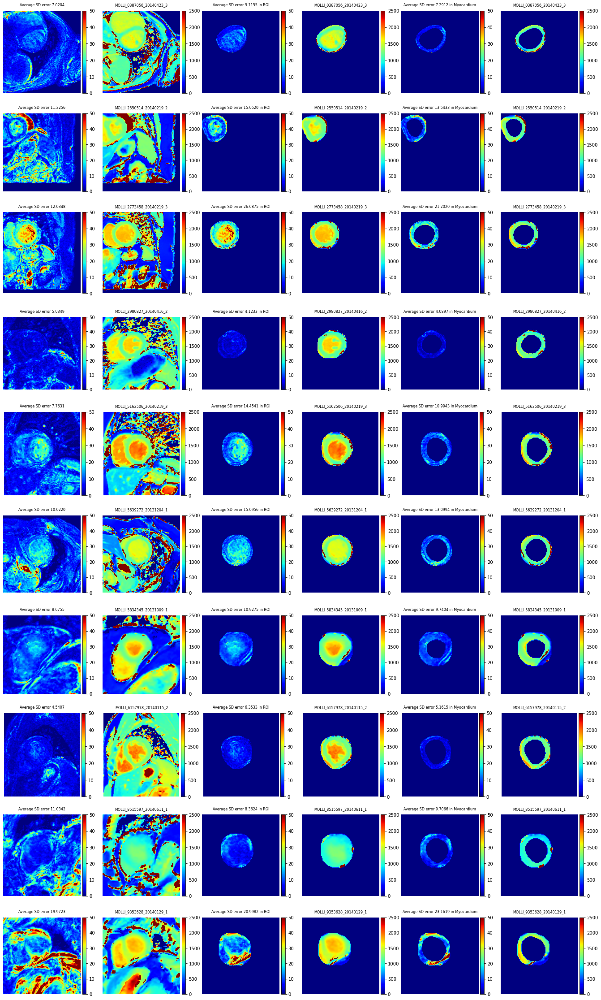

In [40]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R2 Square T1err'] = t1err_square_list
df['R2 ROI T1err'] = t1err_heart_list
df['R2 Myo T1err'] = t1err_myo_list
df_2['R2 PCA'] = pca_changes
df_2['R2 Det'] = mag_det_jac_det_list

### Round 3

In [41]:
r = 3
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [42]:
path = f"{base_path}/moved"
r5_pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    r5_pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(r5_pca_changes))} and std is {np.std(np.array(r5_pca_changes))}")

Mean of Round 2 PCA is 0.7995106562173061 and std is 0.02276437707831468


#### Jacobian Determination

In [43]:
r5_folding_ratio_list = []
r5_mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    r5_folding_ratio_list.append(folding_ratio)
    r5_mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(r5_folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(r5_mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0013901706552132964


#### T1 fitting

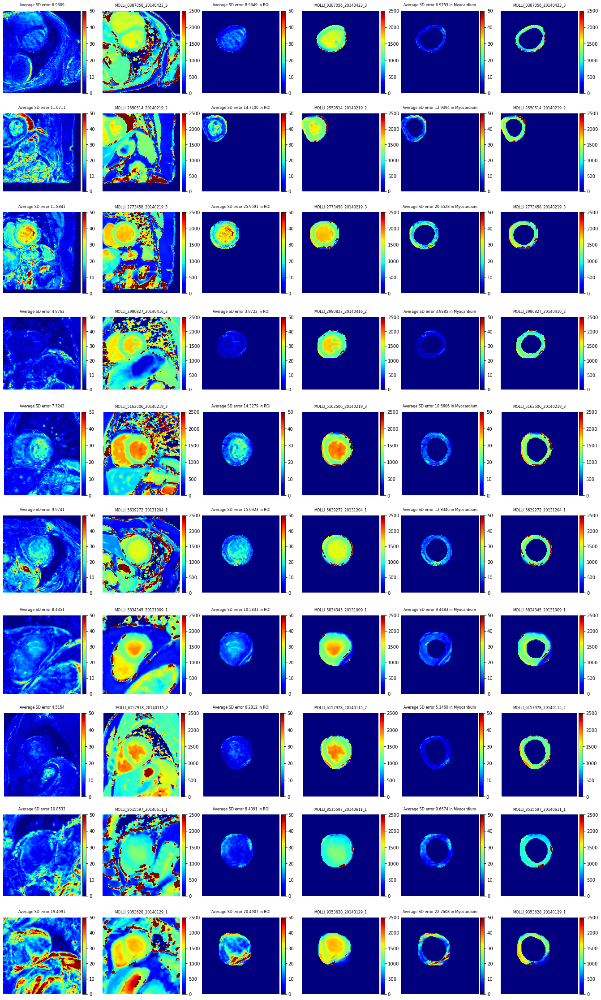

In [44]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R3 Square T1err'] = t1err_square_list
df['R3 ROI T1err'] = t1err_heart_list
df['R3 Myo T1err'] = t1err_myo_list
df_2['R3 PCA'] = pca_changes
df_2['R3 Det'] = mag_det_jac_det_list

### Round 4

In [45]:
r = 4
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [46]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.8012807800768259 and std is 0.022581911014970917


#### Jacobian Determination

In [47]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.001397221116349101


#### T1 fitting

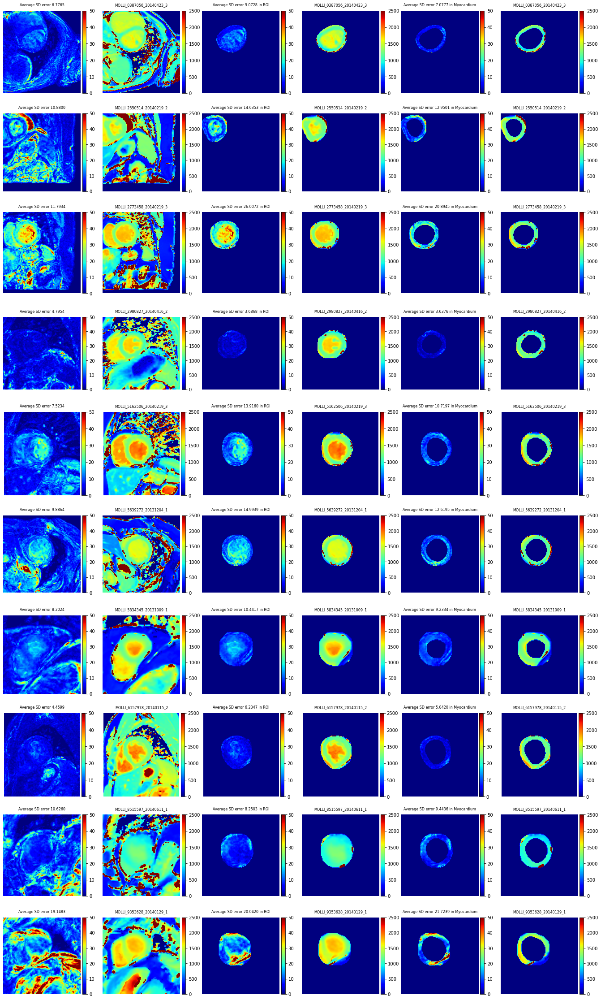

In [48]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R4 Square T1err'] = t1err_square_list
df['R4 ROI T1err'] = t1err_heart_list
df['R4 Myo T1err'] = t1err_myo_list
df_2['R4 PCA'] = pca_changes
df_2['R4 Det'] = mag_det_jac_det_list

### Round 5

In [49]:
r = 5
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [50]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.8018067388951702 and std is 0.022522621435123086


#### Jacobian Determination

In [51]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.000914228439796716


#### T1 fitting

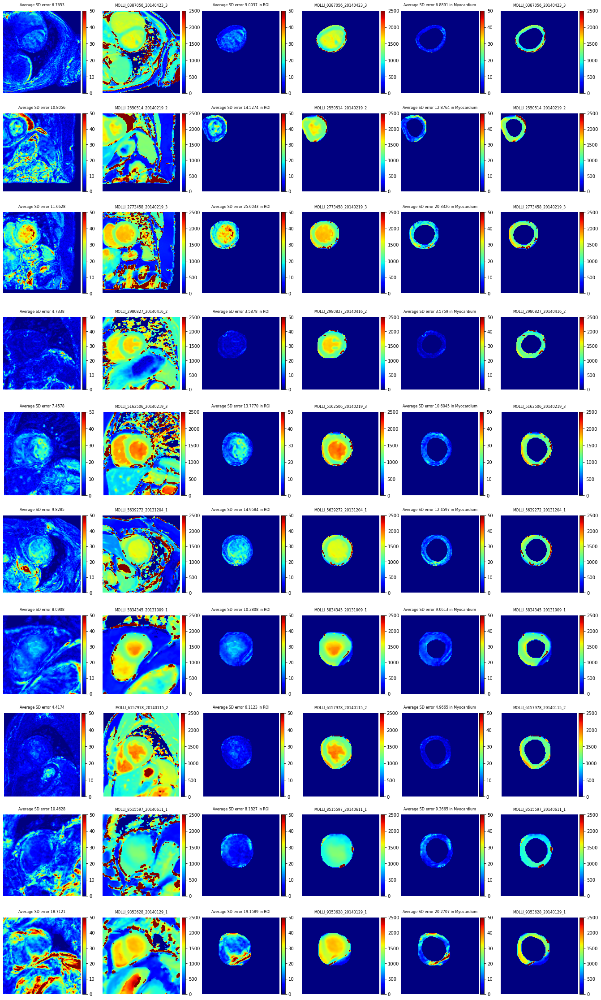

In [52]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R5 Square T1err'] = t1err_square_list
df['R5 ROI T1err'] = t1err_heart_list
df['R5 Myo T1err'] = t1err_myo_list
df_2['R5 PCA'] = pca_changes
df_2['R5 Det'] = mag_det_jac_det_list

### Round 6

In [53]:
r = 6
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [54]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.8023130367544107 and std is 0.022365161115938007


#### Jacobian Determination

In [55]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0009176813764497638


#### T1 fitting

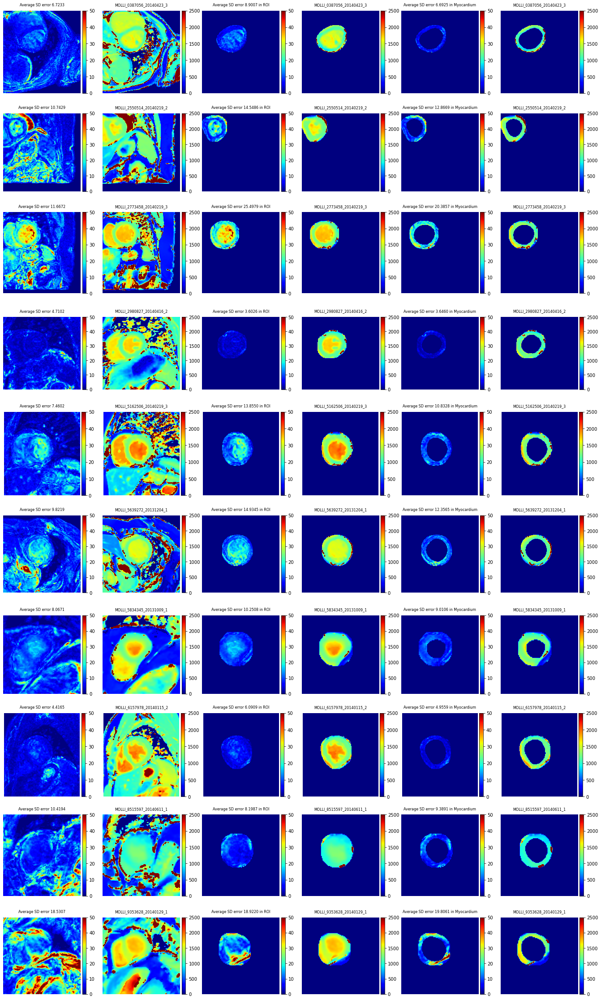

In [56]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R6 Square T1err'] = t1err_square_list
df['R6 ROI T1err'] = t1err_heart_list
df['R6 Myo T1err'] = t1err_myo_list
df_2['R6 PCA'] = pca_changes
df_2['R6 Det'] = mag_det_jac_det_list

### Round 7

In [57]:
r = 7
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [58]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.8028145007866385 and std is 0.022451646329825804


#### Jacobian Determination

In [59]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.000831795681733638


#### T1 fitting

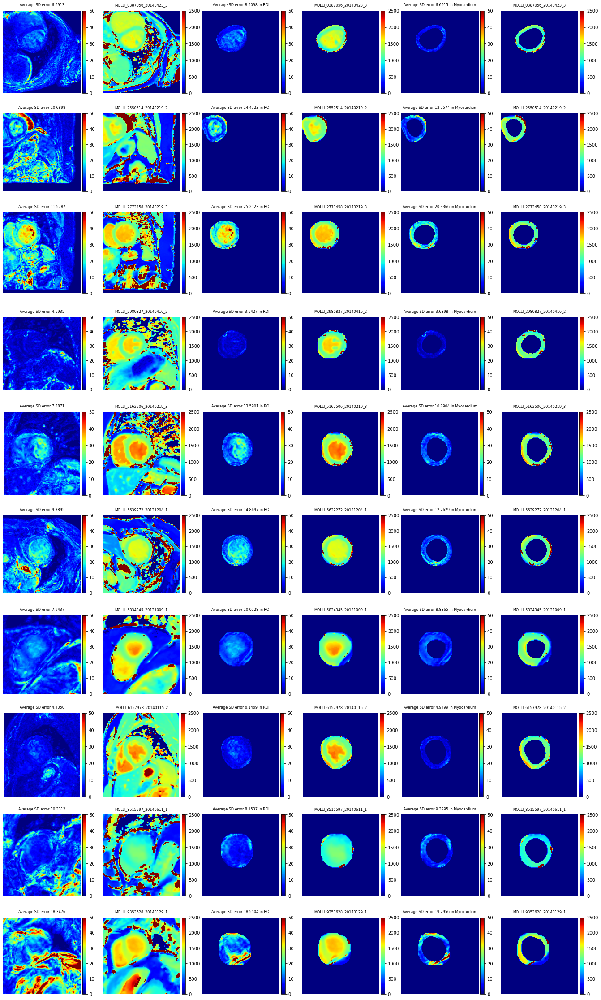

In [60]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R7 Square T1err'] = t1err_square_list
df['R7 ROI T1err'] = t1err_heart_list
df['R7 Myo T1err'] = t1err_myo_list
df_2['R7 PCA'] = pca_changes
df_2['R7 Det'] = mag_det_jac_det_list

### Summary

In [61]:
df

,Cases,Raw Square T1err,Raw ROI T1err,Raw Myo T1err,R1 Square T1err,R1 ROI T1err,R1 Myo T1err,R2 Square T1err,R2 ROI T1err,R2 Myo T1err,...,R4 Myo T1err,R5 Square T1err,R5 ROI T1err,R5 Myo T1err,R6 Square T1err,R6 ROI T1err,R6 Myo T1err,R7 Square T1err,R7 ROI T1err,R7 Myo T1err
0,MOLLI_0387056_20140423_3,7.539072,9.322065,7.916214,7.086664,9.053216,7.339093,7.020360,9.115464,7.291153,...,7.077710,6.765330,9.003655,6.889122,6.723337,8.900713,6.692484,6.691262,8.909816,6.691541
1,MOLLI_2550514_20140219_2,12.360840,16.069435,14.970254,11.642575,15.257485,13.895253,11.225617,15.051982,13.543341,...,12.950084,10.805618,14.527380,12.876427,10.742892,14.548635,12.866876,10.689760,14.472295,12.757382
2,MOLLI_2773458_20140219_3,13.635501,28.783973,24.509481,12.216600,26.966925,21.477915,12.034772,26.687459,21.201984,...,20.894537,11.662769,25.603326,20.332566,11.667183,25.497858,20.385714,11.578678,25.212306,20.336632
3,MOLLI_2980827_20140416_2,5.785524,4.272134,4.320001,5.211295,4.391395,4.337350,5.034941,4.123325,4.089739,...,3.637584,4.733770,3.587771,3.575882,4.710166,3.602578,3.646033,4.693538,3.642701,3.639813
4,MOLLI_5162506_20140219_3,8.644283,16.154370,12.335815,7.943124,15.256169,10.851018,7.763087,14.454100,10.994286,...,10.719735,7.457805,13.776952,10.604453,7.460171,13.855046,10.832775,7.387058,13.590110,10.790445
5,MOLLI_5639272_20131204_1,11.297461,17.183207,16.220113,10.188156,15.472781,13.454979,10.021961,15.095568,13.099428,...,12.619528,9.828534,14.958395,12.459711,9.821892,14.934534,12.356542,9.789506,14.869705,12.262947
6,MOLLI_5834345_20131009_1,10.555566,12.297946,11.507841,8.913766,11.012697,9.936500,8.675531,10.927539,9.740425,...,9.233418,8.090804,10.280775,9.061259,8.067076,10.250824,9.010574,7.943745,10.012774,8.886491
7,MOLLI_6157978_20140115_2,5.011841,7.269378,6.532044,4.663664,6.644135,5.560051,4.540669,6.353272,5.161548,...,5.041951,4.417388,6.112260,4.966547,4.416494,6.090856,4.955925,4.405014,6.146871,4.949857
8,MOLLI_8515597_20140611_1,12.463286,9.094014,10.834321,11.413279,8.620262,10.111083,11.034153,8.362369,9.706571,...,9.443579,10.462757,8.182694,9.366470,10.419380,8.198745,9.389075,10.331170,8.153652,9.329467
9,MOLLI_9353628_20140129_1,23.435838,25.463151,28.887980,21.070055,22.796915,24.919830,19.972269,20.998206,23.161893,...,21.723876,18.712142,19.158869,20.270684,18.530674,18.921993,19.806086,18.347569,18.550429,19.295595


In [62]:
df_ROI_desc = pd.DataFrame()
df_ROI_desc['Cases'] = df['Cases']
for round in range(1, 8):
    df_ROI_desc[f'R{round}/Raw ROI %'] = (df['Raw ROI T1err'] - df[f'R{round} ROI T1err']) / df['Raw ROI T1err']
df_ROI_desc.describe()

,R1/Raw ROI %,R2/Raw ROI %,R3/Raw ROI %,R4/Raw ROI %,R5/Raw ROI %,R6/Raw ROI %,R7/Raw ROI %
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,0.061704,0.091315,0.107199,0.121440,0.134845,0.136784,0.142352
std,0.040923,0.045937,0.044211,0.049096,0.056193,0.056329,0.059988
min,-0.027916,0.022163,0.038313,0.026739,0.034157,0.045199,0.044223
25%,0.050919,0.065696,0.077634,0.093699,0.102783,0.102376,0.108575
50%,0.059364,0.092852,0.105603,0.132213,0.138322,0.136600,0.140986
75%,0.096158,0.118978,0.132376,0.141394,0.159938,0.160773,0.157655
max,0.104710,0.175349,0.195280,0.212902,0.247585,0.256887,0.271479


In [63]:
df_Myo_desc = pd.DataFrame()
df_Myo_desc['Cases'] = df['Cases']
for round in range(1, 8):
    df_Myo_desc[f'R{round}/Raw Myo %'] = (df['Raw Myo T1err'] - df[f'R{round} Myo T1err']) / df['Raw Myo T1err']
df_Myo_desc.describe()

,R1/Raw Myo %,R2/Raw Myo %,R3/Raw Myo %,R4/Raw Myo %,R5/Raw Myo %,R6/Raw Myo %,R7/Raw Myo %
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,0.104469,0.132937,0.156071,0.170144,0.187052,0.188547,0.194043
std,0.051972,0.053980,0.050225,0.049629,0.056420,0.061747,0.065284
min,-0.004016,0.053301,0.076725,0.105922,0.129745,0.121844,0.125275
25%,0.072083,0.097510,0.122873,0.131992,0.139987,0.144024,0.149540
50%,0.122027,0.121849,0.146579,0.152729,0.171335,0.162131,0.163853
75%,0.137159,0.182693,0.201285,0.215897,0.227027,0.232899,0.238612
max,0.170476,0.209811,0.229409,0.247996,0.298300,0.314383,0.332055


In [64]:
df_PCA_desc = pd.DataFrame()
df_PCA_desc['Cases'] = df_2['Cases']
for round  in range(1, 8):
    df_PCA_desc[f'R{round}/Raw PCA %'] = (df_2[f'R{round} PCA'] - df_2['Raw PCA']) / df_2['Raw PCA']
df_PCA_desc.describe()

,R1/Raw PCA %,R2/Raw PCA %,R3/Raw PCA %,R4/Raw PCA %,R5/Raw PCA %,R6/Raw PCA %,R7/Raw PCA %
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,0.009648,0.014856,0.014856,0.018582,0.019255,0.019907,0.020542
std,0.003470,0.004933,0.004933,0.005854,0.006170,0.006445,0.006569
min,0.006080,0.009998,0.009998,0.013185,0.013933,0.014155,0.014959
25%,0.007000,0.011186,0.011186,0.014348,0.014798,0.015184,0.015607
50%,0.007955,0.012658,0.012658,0.015877,0.016414,0.016925,0.017835
75%,0.012830,0.018376,0.018376,0.022285,0.023180,0.023951,0.024536
max,0.015490,0.023086,0.023086,0.028510,0.029883,0.031000,0.031995


In [65]:
df_det = df_2[['R1 Det', 'R2 Det', 'R3 Det', 'R4 Det', 'R5 Det', 'R6 Det', 'R7 Det']]
df_det.describe()

,R1 Det,R2 Det,R3 Det,R4 Det,R5 Det,R6 Det,R7 Det
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,0.002238,0.002827,0.002827,0.001397,0.000914,0.000918,0.000832
std,0.000212,0.000329,0.000329,0.000098,0.000076,0.000067,0.000058
min,0.001768,0.002041,0.002041,0.001245,0.000732,0.000772,0.000743
25%,0.002161,0.002744,0.002744,0.001330,0.000891,0.000899,0.000816
50%,0.002266,0.002808,0.002808,0.001410,0.000921,0.000928,0.000830
75%,0.002320,0.003050,0.003050,0.001451,0.000957,0.000954,0.000850
max,0.002552,0.003235,0.003235,0.001557,0.001000,0.001009,0.000923
